# Multilayer Perceptron in PyTorch

## Introduction

### Goal
Learn the basics of PyTorch (PT) by working on an artificial classification problem.

### Plan
In this tutorial we will create a set of synthetic data that we will use as an example problem.
Then we will create a Multilayer Perceptron (MLP) model and learn its parameters from the data. Finally we will visualize the different learning measures and the parameters of the model.

In a second part we will modify our data and adapt the hyper-parameters (e.g. number of hidden neurons) of our model to allow better classification.

In the next part we will use the basic functions of PT to understand our process and how PT works. But we will also mention the high level features and aids of PT that facilitate our tasks.



### Requirements

Python >=3.5

Modules python:
- pytorch >=1.0
- numpy
- matplotlib

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## 1. Data generation

In this part, we will generate a data set of 1000 points which is not linearly separable.

#### Create the artificial data sets

## Exercise 1

Create 1000 points of 2 dimensions $(x_0, x_1)$ with their coordinates between 0 et 1 $x_0, x_1 \in [0, 1]$.


## Exercise 2

Assign to each point a binary class $y$ (0 ou 1) following the condition: 
$$
y = \begin{cases}
1 &\text{if $x_0 > 0.2$ et $x_1 > 0.4$}\\
0 &\text{else}
\end{cases}
$$

## Exercise 3

Create a matrix of data `data` with shape `(1000, 3)` with a point per row, the two first columns contain the points coordinates $(x_0, x_1)$ the last column contains the class $y$.

## Exercise 4

Split the data into 3 sets (on matrix for each): 800 points for `train`, 100 points for `valid` and 100 for `test`

## Exercise 5

Visualise the data using a scatter plot (`plt.scatter`).


We expect to find something similar to this:

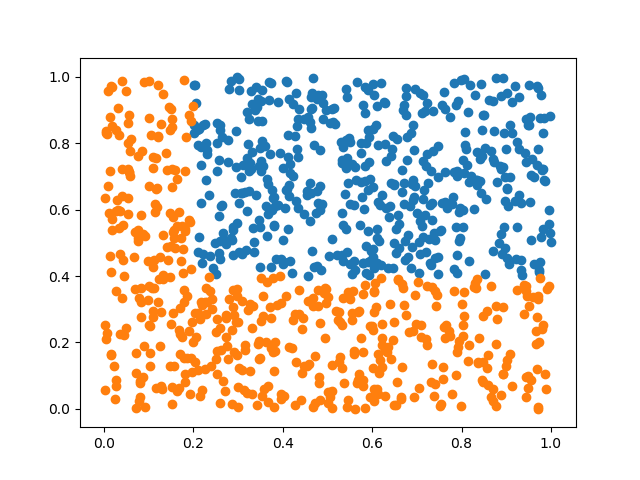

Shape of Labelled data =  (1000, 3)
Lenght of Train Validate and Test sets respectively =  800 100 100


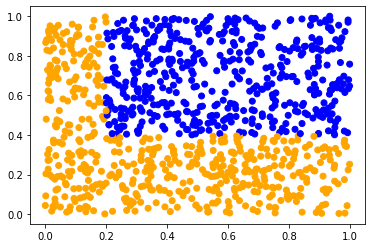

In [2]:
# Generate, split and plot the data

"""1000 points of 2 dimensions  (x0,x1)  with their coordinates between 0 et 1"""
import random
x = np.random.randn(1000, 2)

"""Computing labels 0 or 1 of each index of x"""
y = []
for i in range(len(x)):

  if x[i][0] > 0.2 and x[i][1]>0.4:
    y.append(1)
  else:
    y.append(0)

""" Combining x and y arrays"""
x = np.transpose(x,axes = None)
y = np.transpose(y,axes = None)
data = np.vstack((x,y))
data = np.transpose(data, axes = None)
print("Shape of Labelled data = ", data.shape)

"""split data into three sets - train, validate, and test"""
train, valid, test = np.split(data, [int(.8 * len(data)), int(.9 * len(data))])
print("Lenght of Train Validate and Test sets respectively = ", len(train), len(valid), len(test))

"""Visualizing the data"""
color= ['Blue' if l == 1 else 'Orange' for l in data[:,2]]
plt.scatter(data[:,0], data[:,1], color = color)


**Run the following cell to make sure you have done the previous exercises correctly.**

In [3]:
# Verification des dimensions des donnees
assert data.shape == (1000, 3)

# Verification des division desd donnees
assert train.shape == (800, 3)
assert valid.shape == (100, 3)
assert test.shape == (100, 3)

for dataset in [train, valid, test]:
    # Verification des classes
    assert (dataset[dataset[:,-1]==1,0] > 0.2).all()
    assert (dataset[dataset[:,-1]==1,1] > 0.4).all()
    assert ((dataset[dataset[:,-1]==0,0] <= 0.2) | (dataset[dataset[:,-1]==0,1] <= 0.4)).all()
    
print('Everything looks good!')

Everything looks good!


## 2. Create the model
In this part, we will create, with PyTorch, a model to predict the class $y$ of a point using only its coordinates $(x_0, x_1)$.

The model we will create to classify the data is a Multilayer Perceptron with a single hidden layer:

\begin{align}
h_1 &= \sigma(x W_1 + b_1) \\
\hat{y} &= \sigma(h_1 W_2 + b_2) \\
& \textrm{ avec } & \\
\sigma(t) &= \frac{1}{1+e^{-t}}
\end{align}

$\hat{y}$ will the model's estimation for the class of the point.

## Exercise 6
What are the model parameters?


**Answer:** Model parameters are weights (W) and biases (b) that constitutes an multilayer perceptron model, for instance, in given project, W1, W2, b1, and b2 are model paramters. 

### Implementation en PyTorch

First we will do a low level implementation where we will only use the AutoDiff feature (which allows to automatically compute gradients) of PyTorch.

PyTorch has a similar API to numpy. The big difference is that for symbols for which we want to have a gradient, we must include the argument named `requires_grad=True`.

For example $W_1$ is a parameter of the model and we are interested in the gradient of the loss with respect to this symbol. So at initialization time we will add `requires_grad=True`.

## Exercise 7

What the dimensions of each of these symbols: $x, y, W_1, b_1, W_2, b_2$?


**Answer:** The dimension of x, y, W1, b1, W1, b2 are (1000,2), (1000,1), (2, 2), (1, 2), (2,1), and (1,1) respectively. 


## Exercise 8
Create a function that initializes and returns a tuple with the MLP  parameters.


In [4]:
# Create the model
import torch

def init_mlp(n_input, n_hidden, n_output):    
    w1 = torch.randn((n_input,n_hidden), requires_grad = True)
    b1 = torch.zeros((1,n_input), requires_grad = True)
    w2 = torch.randn((n_hidden,n_output), requires_grad = True)
    b2 = torch.zeros((1,n_output), requires_grad = True)

    return (w1, b1, w2, b2)
    

params = init_mlp(2, 2, 1)
print(params)

(tensor([[0.7004, 0.7180],
        [0.8116, 0.4433]], requires_grad=True), tensor([[0., 0.]], requires_grad=True), tensor([[0.1495],
        [0.6790]], requires_grad=True), tensor([[0.]], requires_grad=True))


### Run a forward pass of the model on the following data points

## Exercise 8
What is the desired response for the following points?
$$(0.1, 0.5), (0.3, 0.5), (0.3, 0.15), (0.1, 0.15)$$



**Answer:** The desired output (y) should be (0, 1, 0, 0) as per the conditions defined in exercise 2. 

## Exercise 9
Execute the model on the previous points and print $\hat{y}$


In [5]:
# Create a function sigmoid(t) that computes the sigmoid function on t
def sigmoid(t):
 return 1/(1 + torch.exp(-t))

# Create a function mlp(x, params) that computes the MLP outputs given the inputs x
def mlp(x, params):
  

  h1 = sigmoid(torch.mm(x, params[0])+params[1])

  y_ = sigmoid(torch.mm(h1,params[2])+params[3])

  return y_

# Create a tensor containing the previous points
x_tensor = torch.tensor([[0.1,0.5],[0.3,0.5],[0.3,0.15],[0.1,0.15]])


# Call and print output of mlp(points, params) (NOTE: use torch.no_grad())
with torch.no_grad():
  
  output = mlp(x_tensor, params)
print("output = ", output)


output =  tensor([[0.6180],
        [0.6247],
        [0.6163],
        [0.6094]])


In [6]:
x_tensor.shape

torch.Size([4, 2])

We can observe that the results are not good, because they are far from the expected result.

If we want to compute on our test data the performance of the model we will define an accuracy function, which takes a decision for each data based on $\hat{y}$ and compares it to $y$.

$$
\text{accuracy} = \frac{1}{N} \sum_i^N (1 - abs(y - round(\hat{y}_i))) 
$$

The accuracy represents the rate of correctly classified points. It will be $1$ if all points are correctly classified, $0$ if all are misclassified and $0.5$ if half are well classified.

## Exercise 10

Implement the accuracy using Pytorch functions `torch.mean`, `torch.abs`, `torch.round`.


In [7]:
def accuracy(estimated, reference):
    accuracy = torch.mean(1-torch.abs(reference-torch.round(estimated)))
    return accuracy


## Exercise 11

Evaluate and print the score on the `train` set


In [8]:
def score_model(params, data):
    ### BEGIN SOLUTION
    tensor_x = torch.from_numpy(data[:,0:2]).float()
    tensor_y = torch.from_numpy(data[:,2:]).float()
    #print(data_tensor.size())
    with torch.no_grad():
      output = mlp(tensor_x, params)
    #print("output = ", output)
    return accuracy(output,tensor_y)
    ### END SOLUTION
#print(train[:,0:2].shape)   
score_model(params, train)

tensor(0.4762)

## Exercise 12
Do the same with `valid` and `test`


In [9]:
### BEGIN SOLUTION
print("Score of model over valid data =", score_model(params, valid))
print("Score of model over test data =", score_model(params, test))
### END SOLUTION

Score of model over valid data = tensor(0.5700)
Score of model over test data = tensor(0.4200)


## Exercise 13

Explain the results.

**Answer:** Currently, the scores of our model are unsatisfactory i.e. the model is not able to classify the input as 0 or 1. Evidently, the train, valid, and test results are 0.4762, 0.57, 0.42 which indicates an average 50% accuracy (not enough). This is due to the fact that the model is randomly initialize by weights and biases that are not tuned/optimized. Therefore, to have better accuracy, we need to optimize or find better model paramters.

## 4. Training the model

To find the best parameters for our model we will enter it with the training data. For this we will define a cost function to optimize.

As we are trying to solve a binary classification task, we will use the crossentropy cost function:

$$
\mathcal{L} = \sum -y \log(\hat{y}) - (1-y) \log(1-\hat{y})
$$

## Exercise 14
Implement the cost function in PyTorch.


In [10]:
def bce(est, ref):

    L = torch.sum((-ref*(torch.log(est)) - (1-ref)*(torch.log(1-est))))
    return L


To train our model by means of Gradient Descent (GD) we will iteratively update with small increments our parameters:

\begin{align}
W_1^n &= W_1^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta W_1} \\
b_1^n &= b_1^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta b_1} \\
W_2^n &= W_2^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta W_2} \\
b_2^n &= b_2^{n-1} - \eta \frac{\delta \mathcal{L}}{\delta b_2}
\end{align}

Where $\eta$ is our learning rate.

We need to calculate the gradients:
$$
\frac{\delta \mathcal{L}}{\delta W_1}, \frac{\delta \mathcal{L}}{\delta b_1}, \frac{\delta \mathcal{L}}{\delta W_2}, \frac{\delta \mathcal{L}}{\delta b_2}
$$

For the gradients of the cost function with respect to the parameters, we could calculate them by hand. But we are lazy. So we will use PyTorch `error.backward()` will do this for us in an optimized way using Dynamic Programming (DP) and populate the tensors with the gradients.

Finally we will run a training of 10 `epochs` with a `batch_size=100`.
For this we will do the following steps:
1. Calculate the number of iterations (`n_iterations`) per epoch (remember that an iteration is an update of the parameters and an epoch is a competing use of all our training data)
2. For each epoch (`for epoch in range(n_epochs):`)
    1. Randomly reorder the `train` data (use `torch.randperm()`)
    2. Evaluate and print the model score on the training data
    3. For each iteration (`for iteration in range(n_iterations):`)
        1. Select a block of `batch_size` examples
        2. Run the forward pass on the model (`mlp()`)
        3. Compute the loss (`bce()`)
        4. *Zero the gradients*
        5. Compute the gradients
        6. *Update the parameters doing gradient descent*

**Note 1:** Remember that PyTorch keeps track of all the operations you make with tensors to build the DAG graph. In some cases we want to avoid that, such as when setting the gradients to zero or performing the gradient descent update of the parameters. In those cases we may use `w1.data` or `w1.grad.data`.

**Note 2:** Zero the gradients means accessing the gradient of each parameter and setting it to zero. We need this because PyTorch `.backward()` method accumulates the gradients instead of replacing them.
    


## 5. Visualization of the model

To monitor the evolution of the learning of our model, we will visualize the value of the cost function, the classification score and the parameters of the first layer of our model.  

We will run our experiments with different values of the following hyperparameters to better understand their effect:
- `learning_rate`
- `batch_size`


### Visualization of the cost function

The cost function is the value we aim to reduce with the training iterations. To visualize it we will create an empty list (`couts = []`) at the beginning of our training and we will add (`couts.append(cout)`) the value resulting from the cost at each iteration. At the end of the training we will visualize the curve (`plt.plot(costs)`).

## Exercise 16
Rewrite the `train_model` function so that it returns the average loss of every epoch. Run it and plot the loss of a training procedure. While we are at it, make the printing optional with an additional keyword argument.

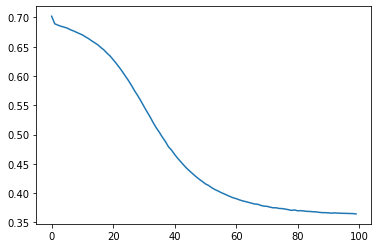

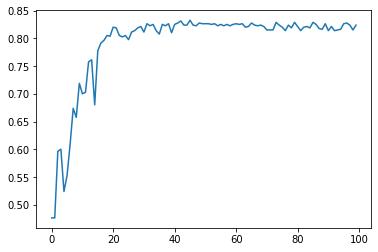

In [12]:
def train_model(params, data, eta=0.05, n_epochs=1, batch_size=16, verbose=False):
    acc_score = []
    ### BEGIN SOLUTION
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    costs = []

    for epoch in range(n_epochs):
        ### BEGIN SOLUTION
        # Randomly reorder the `train` data (use `torch.randperm()`)       
        train_i = torch.randperm(n_data)
        
        train_shuffled = data[train_i]
        #print(data.size, train_shuffled.size)
        #print("print ===",train_shuffled)
        # Evaluate and print the model score on the training data
        score = score_model(params, train_shuffled)
        # print(score)
        acc_score.append(score)
        
        ### END SOLUTION

        cost = []
        for iteration in range(n_iterations):
            ### BEGIN SOLUTION

            # 1. Select a block of `batch_size` examples
            train_batch = torch.from_numpy(train_shuffled[batch_size*iteration:batch_size*(iteration+1)]).float()
            #print(train_batch)
            # 2. Run the forward pass on the model
            y_est = mlp(train_batch[:,:2], params)
            #print(y_est)
            #print(train_batch[:,2])
            # 3. Compute the error
            

            e = bce(y_est, train_batch[:,2:])
            #print(e)
            cost.append(e/batch_size)

            # 5. Compute the gradients
            e.backward()
            
            # 6. Update the parameters using their gradients
            #print("w1 self = ", params[0]-params[0].grad*eta)
            with torch.no_grad():
              for i in range(len(params)):
                params[i].sub_(params[i].grad*eta)
                #print(params[i])
                params[i].grad.zero_()
            #print("w1 auto = ", params[0])
        if verbose == True:
          print("Average cost of iteration = ", torch.mean(torch.tensor(cost)))
        params
        #print("******************************")  
        costs.append(torch.mean(torch.tensor(cost)))
    ### END SOLUTION
    return costs, acc_score;

params = init_mlp(2, 2, 1)                    
losses, acc = train_model(params, train, eta=0.005, n_epochs=100)
plt.figure(1)
plt.plot(losses)
plt.figure(2)
plt.plot(acc)

### Effect of the learning rate

We will run our learning with different learning rates to see its effect on the cost function.

## Exercise 17
Display the training loss curve for learning rates `[0.5, 0.05, 0.005, 0.0005]`

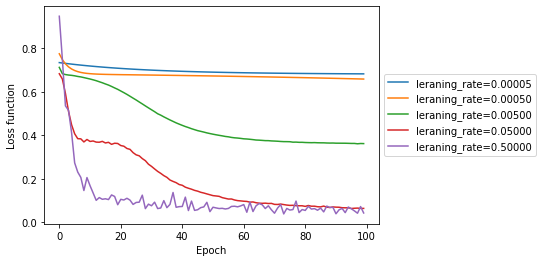

In [13]:
learning_rates = [0.5, 0.05, 0.005, 0.0005, 0.00005]
n_epochs = 100
batch_size = 16

losses = {}

# Train a model with each learning rate and populate losses with the learning rate as key and the loss series as values


for i in learning_rates:
  loss = []
  params = init_mlp(2, 2, 1) 
  loss, _ = train_model(params, train, eta=i, n_epochs = n_epochs)
    
  #print(loss)
  losses[i] = loss


plt.figure()
for lr, loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'leraning_rate={lr:.5f}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

### Effect of batch size

We will now run our training with different batch sizes to see its effect on the cost function.

## Exercise 18

Display the cost function evaluated on all training data at each epoch for batch sizes `[n_data, 100, 50, 10, 5, 1]`


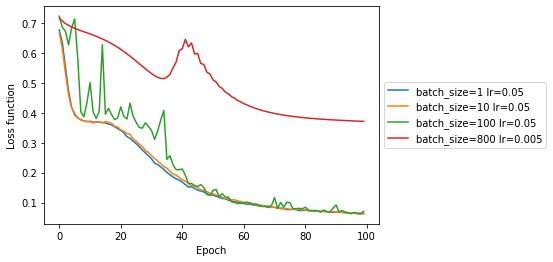

In [14]:
n_data = train.shape[0]

n_epochs = 100
batch_sizes = [n_data, 100, 10, 1]
lrs = [0.005, 0.05, 0.05, 0.05]

losses = {}


for i,j in zip(lrs, batch_sizes):
  loss = []
  params = init_mlp(2, 2, 1) 
  loss, _ = train_model(params, train, eta=i, n_epochs = n_epochs, batch_size = j, verbose=False)
  losses[(j,i)] = loss


# Visualiser les courbes de cout
plt.figure()
for (bs, lr), loss_curve in sorted(losses.items()):
    plt.plot(loss_curve, label=f'batch_size={bs} lr={lr}')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.ylabel('Loss function')
plt.xlabel('Epoch');

### Visualization of the performance

Another value worth monitoring is the classification accuracy of the model.

## Exercise 19

Visualize the accuracy on the train, valid and test data on each epoch

In [15]:
"""Model for testing"""

def test_model(params, data, n_epochs=1, batch_size=16, verbose=False):
    acc_score = []
    ### BEGIN SOLUTION
    n_data = data.shape[0]
    n_iterations = n_data // batch_size
    couts = []
    for epoch in range(n_epochs):
        # Randomly reorder the `train` data (use `torch.randperm()`)       
        test_i = torch.randperm(len(dataset))
        test_shuffled = train[test_i]
        
        # Evaluate and print the model score on the training data
        score = score_model(params, test_shuffled)
        acc_score.append(score)
         
        cout = []

        for iteration in range(n_iterations):

            # 1. Select a block of `batch_size` examples
            test_batch = torch.from_numpy(test_shuffled[batch_size*iteration:batch_size*(iteration+1)]).float()

            # 2. Run the forward pass on the model
            y_est = mlp(test_batch[:,:2], params)

            # 3. Compute the error
            e = bce(y_est, test_batch[:,2:])
            cout.append(e/batch_size)
            # 5. Compute the gradients
            e.backward()

            with torch.no_grad():
              for i in range(len(params)):
                params[i].sub_(params[i].grad*eta)
                #print(params[i])
                params[i].grad.zero_()

        if verbose == True:
          print("Average cost of iteration = ", torch.mean(torch.tensor(cout)))
        #print("******************************")  
        couts.append(torch.mean(torch.tensor(cout)))

    return couts, acc_score

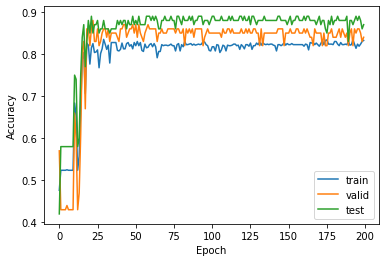

In [25]:
params = init_mlp(2, 2, 1)

n_data = train.shape[0]


n_epochs = 200
batch_size = 10
learning_rate_value = 0.05
n_iterations = n_data // batch_size

accuracies = {}

accuracies['train'] = []
accuracies['valid'] = []
accuracies['test'] = []



acc_score_test = []
acc_score_valid = []
acc_score_train = []

couts = []


for epoch in range(n_epochs):
    # Randomly reorder the `train` data (use `torch.randperm()`)       
    test_i = torch.randperm(len(test))
    test_shuffled = test[test_i]
    
    valid_i = torch.randperm(len(valid))
    valid_shuffled = valid[valid_i]

    train_i = torch.randperm(len(train))
    train_shuffled = train[train_i]

    # Evaluate and print the model score on the training data
    score_test = score_model(params, test_shuffled)
    acc_score_test.append(torch.mean(score_test))

    score_train = score_model(params, train_shuffled)
    acc_score_train.append(torch.mean(score_train))   

    score_valid = score_model(params, valid_shuffled)
    acc_score_valid.append(torch.mean(score_valid))     
     
    cout = []

    for iteration in range(n_iterations):

        # 1. Select a block of `batch_size` examples
        test_batch = torch.from_numpy(test_shuffled[batch_size*iteration:batch_size*(iteration+1)]).float()

        # 2. Run the forward pass on the model
        y_est = mlp(test_batch[:,:2], params)

        # 3. Compute the error
        e = bce(y_est, test_batch[:,2:])
        cout.append(e/batch_size)
        # 5. Compute the gradients
        e.backward()

        with torch.no_grad():
          for i in range(len(params)):
            params[i].sub_(params[i].grad*learning_rate_value)
            #print(params[i])
            params[i].grad.zero_()
    couts.append(torch.mean(torch.tensor(cout)))

accuracies['train'] = acc_score_train
accuracies['test'] = acc_score_test
accuracies['valid'] = acc_score_valid


plt.figure()
for split, v in accuracies.items():
    plt.plot(v, label=split)

plt.legend(loc='best')
plt.ylabel('Accuracy')
plt.xlabel('Epoch');

### Visualization of the model parameters

For pedagogical reasons we will now visualize the parameters of the model with its geometrical interpretation.
We will represent the parameters of the first layer of the MLP as a line (the decision boundary).

In [26]:
def plot_decision_boundaries(w, b, ax=None, **kwargs):
    ax = ax or plt.gca()
    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    
    arts = []
    for i in range(w.shape[1]):
        w_i = w[:, i]
        if len(b.shape)==1:
            b_i = b[i]
        else:
            b_i = b[:, i]
        
        intersections = []
        
        if w_i[1] != 0:
            yx0 = -w_i[0]/w_i[1] * x0 - b_i/w_i[1]
            yx1 = -w_i[0]/w_i[1] * x1 - b_i/w_i[1]
            
            if y0 <= yx0 <= y1:
                intersections.append((x0, yx0))
            
            if y0 <= yx1 <= y1:
                intersections.append((x1, yx1))
            
        if w_i[0] != 0:
            xy0 = -w_i[1]/w_i[0] * y0 - b_i/w_i[0]
            xy1 = -w_i[1]/w_i[0] * y1 - b_i/w_i[0]
            
            if x0 <= xy0 <= x1:
                intersections.append((xy0, y0))
            
            if x0 <= xy1 <= x1:
                intersections.append((xy1, y1))

        if len(intersections) == 2:
            xs, ys = zip(*intersections)
            lines, = ax.plot(xs, ys, **kwargs)
        
            arts.append(lines)
    
    ax.set_xlim([x0, x1])
    ax.set_ylim([y0, y1])
    
    return arts
        
def plot_model_and_data(params, dat=None, sel=None, ax=None):
    w, b, _, _ = params
    ax = ax or plt.gca()
    ax.set_prop_cycle(None)
    prop_cycle = ax._get_patches_for_fill.prop_cycler

    import itertools
    props = list(itertools.islice(prop_cycle, 3))
    
    all_arts = []
    
    if dat is not None:
        arts = ax.scatter(dat[dat[:,-1]==1,0], dat[dat[:,-1]==1,1], 
                            facecolors='none', edgecolors=props[0]['color'], alpha=0.2)
        all_arts.append(arts)

        arts = ax.scatter(dat[dat[:,-1]==0,0], dat[dat[:,-1]==0,1], 
                            facecolors='none', edgecolors=props[1]['color'], alpha=0.2)
        all_arts.append(arts)
    
    if sel is not None:
        arts = ax.scatter(sel[sel[:,-1]==1,0], sel[sel[:,-1]==1,1], 
                            facecolors=props[0]['color'], edgecolors=props[0]['color'])
        all_arts.append(arts)

        arts = ax.scatter(sel[sel[:,-1]==0,0], sel[sel[:,-1]==0,1], 
                            facecolors=props[1]['color'], edgecolors=props[1]['color'])
        all_arts.append(arts)
    
    line_arts = plot_decision_boundaries(w.detach().numpy(), b.detach().numpy(),
                             ax=ax,
                             color=props[2]['color'],
                             linewidth=2.0)
    all_arts += line_arts
    
    return all_arts

You can use the two functions created above to visualize a learning animation. You simply get the value returned by the function `plot_model_and_data(params, sel=train, ax=ax)` after each epoch. 

```
art = plot_model_and_data(params, sel=train, ax=ax)
arts.append(art)
``` 

## Exercise 20
Visualise the decision boundaries during a training procedure.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


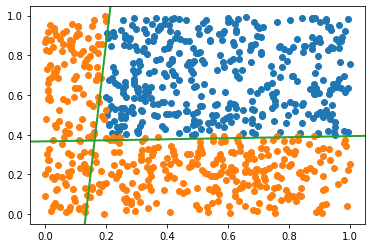

In [27]:
n_data = train.shape[0]

n_epochs = 250
batch_size = 10
learning_rate_value = 0.05

arts = []
fig, ax = plt.subplots()


acc_score = []

n_iterations = n_data // batch_size
costs = []

params = init_mlp(2, 2, 1)    

for epoch in range(n_epochs):
    
    # Randomly reorder the `train` data (use `torch.randperm()`)       
    train_i = torch.randperm(len(train))
    train_shuffled = train[train_i]
    
    # Evaluate and print the model score on the training data
    score = score_model(params, train_shuffled)
    #print(score)
    acc_score.append(score)
    
    

    cost = []
    for iteration in range(n_iterations):
       

        # 1. Select a block of `batch_size` examples
        train_batch = torch.from_numpy(train_shuffled[batch_size*iteration:batch_size*(iteration+1)]).float()

        # 2. Run the forward pass on the model
        y_est = mlp(train_batch[:,0:2], params)

        # 3. Compute the error
        e = bce(y_est, train_batch[:,2:])
        cost.append(e)

        # 5. Compute the gradients
        e.backward()
        
        # 6. Update the parameters using their gradients

        with torch.no_grad():
          for i in range(len(params)):
            params[i].sub_(params[i].grad*learning_rate_value)
            #print(params[i])
            params[i].grad.zero_()

    costs.append(torch.mean(torch.tensor(cost)))

    art = plot_model_and_data(params, sel=train, ax=ax)
    arts.append(art)



anim = animation.ArtistAnimation(fig, arts, interval=50, repeat_delay=3000, blit=True);
HTML(anim.to_jshtml())